# Proyecto: Predicción de evaluación y ventas de videojuegos

**MDS7202: Laboratorio de Programación Científica para Ciencia de Datos**

### Cuerpo Docente:

- Profesor: Pablo Badilla
- Auxiliar: Ignacio Meza D.
- Ayudante: Constanza Peña

### Equipo:

- Integrante:José Luis cádiz Sejas

- Nombre de usuarios en Codalab: joseluis


### Link de repositorio de GitHub: `https://github.com/JLCdata/Programacion_Data_Science`




## 1. Introducción

**El objetivo del presente proyecto consiste en predecir la evaluación y las ventas de videojuegos mediante modelos de clasificación y regresión.**

**Los datos que se proveenson un  dataset con 7881 ejemplos, en donde cada fila describe las caracteristicas principales de un juego en particular, teniendo en total 16 atributos de tipo texto, númerico y categorico, siendo las variables objetivos de tipo categorica y númerica.**

**Para desarrollar los modelos, los datos tuvieron que ser limpiados y luego codificados, vectorizados y normalizados según el tipo de dato categorico, texto y núemerico respectivamente.**

**El modelo de clasificación se evalua en base a la métrica F1 measure ya que esta permite medir un equilibrio entre Precision y Recall, y la segunda con r2, la cual permite medir el grado de correlación entre la variable real y el predict.**

**Nuestra propuesta para resolver el problema consistio en optimizar el modelo basado en XGboost, el cual logro buenos resultados para la clasificación, ya que el F1 pedido era 0.15 y se logro llegar a 0.34. En cuanto regresión no se logro cumplir con la meta esperada de 0.31, llegando a 0.29 r2.**

---
## 2. Análisis Exploratorio de Datos

In [1]:
# Import de Librerias base
import pandas as pd
import missingno as msno
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.manifold import TSNE
import umap
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split 
from sklearn.feature_selection import SelectPercentile, f_classif,mutual_info_regression

# Import Modelos
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
import xgboost as xgb

# Reducción dimensionalidad para pipeline
from sklearn.decomposition import PCA
from sklearn.decomposition import TruncatedSVD

# Import métricas
from sklearn.metrics import classification_report
from sklearn.metrics import r2_score

# Import Halving Grid Search
from sklearn.experimental import enable_halving_search_cv 
from sklearn.model_selection import HalvingGridSearchCV

# Librerias de NLP
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')
from nltk import word_tokenize  
from nltk.stem import PorterStemmer
from sklearn.feature_extraction.text import CountVectorizer
stop_words = stopwords.words('english')

# Clase tokenizador con Stemming
class StemmerTokenizer:
    def __init__(self):
        self.ps = PorterStemmer()
    def __call__(self, doc):
        doc_tok = word_tokenize(doc)
        doc_tok = [t for t in doc_tok if t not in stop_words]
        return [self.ps.stem(t) for t in doc_tok]

[nltk_data] Downloading package stopwords to C:\Users\Jose
[nltk_data]     Luis\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [2]:
# Seteo jupyter notebook
pd.set_option('display.max_columns', None)
import warnings
warnings.filterwarnings("ignore")
import plotly.offline as py
py.init_notebook_mode()

In [3]:
# Lectura
df = pd.read_pickle("train.pickle")

In [4]:
df.shape

(7881, 16)

### Analisis de valores nulos

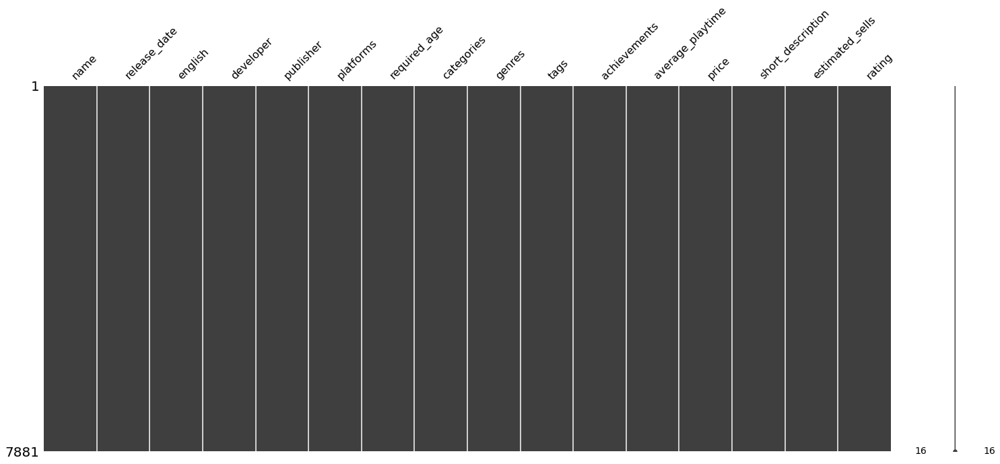

In [5]:
# Matriz de nulidad
msno.matrix(df)
plt.show()

**Como primer acercamiento no se observan valores faltantes, a continuación se procede a contar datos no nulos para compararlo con la cantidad de registros del dataframe.**

In [6]:
# Conteo de datos no nulos
conteo_nulos = (len(df) -
                df.isna().sum()).to_frame("Obs").reset_index().rename(
                    columns={"index": "Col"})

px.bar(conteo_nulos.sort_values('Obs'),
       x='Obs',
       y='Col',
       height=800,
       title='Cantidad de Datos no Nulos por Columna')

**Se observa que todos los tags no presentan valores faltantes.**

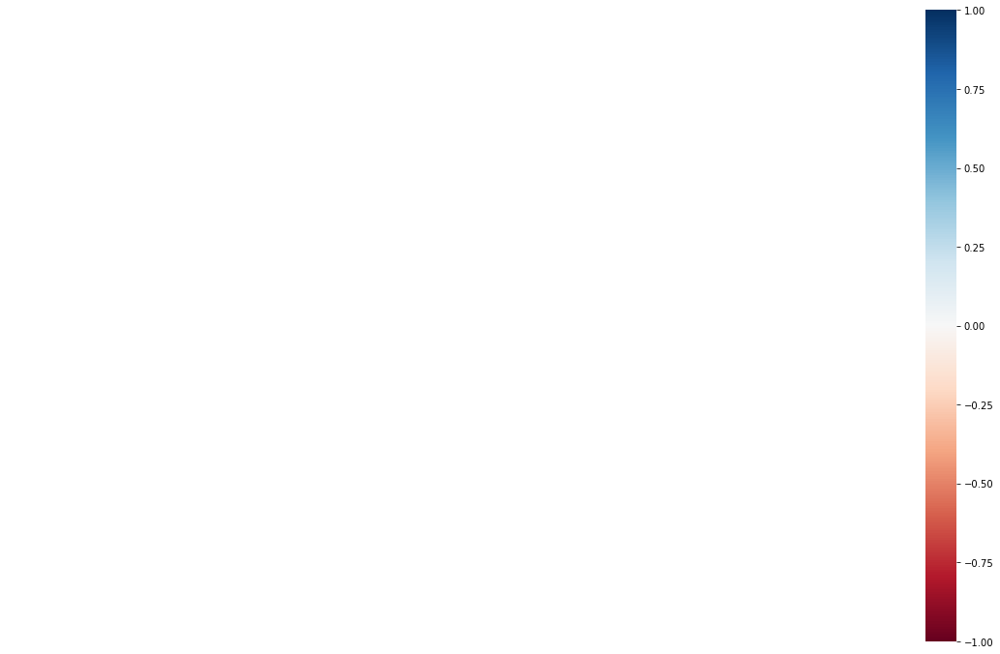

In [7]:
# Mapa de calor
msno.heatmap(df)
plt.show()

**Luego es de esperarse que el mapa de calor no presente relación alguna.**

**Tipos de datos**

In [8]:
# Tipos de datos
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7881 entries, 0 to 7880
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   name               7881 non-null   object  
 1   release_date       7881 non-null   object  
 2   english            7881 non-null   int64   
 3   developer          7881 non-null   object  
 4   publisher          7881 non-null   object  
 5   platforms          7881 non-null   object  
 6   required_age       7881 non-null   int64   
 7   categories         7881 non-null   object  
 8   genres             7881 non-null   object  
 9   tags               7881 non-null   object  
 10  achievements       7881 non-null   int64   
 11  average_playtime   7881 non-null   int64   
 12  price              7881 non-null   float64 
 13  short_description  7881 non-null   object  
 14  estimated_sells    7881 non-null   int64   
 15  rating             7881 non-null   category
dtypes: cat

In [9]:
# Tags number
numerics=df.select_dtypes(include=["int64","float64"])
numerics.head(2)

,english,required_age,achievements,average_playtime,price,estimated_sells
0,1,0,23,0,0.00,3914
1,1,0,53,65,10.99,10728


In [10]:
# Cantidad de valores diferentes en datos númericos
for i in numerics.columns:
    print(i)
    print(len(df[i].unique()))
    print(" ")

english
2
 
required_age
6
 
achievements
280
 
average_playtime
1257
 
price
162
 
estimated_sells
4879
 


In [11]:
# Tags string/category
strings=df.select_dtypes(include=["object","category"])
strings.head(2)

,name,release_date,developer,publisher,platforms,categories,genres,tags,short_description,rating
0,An Aspie Life,2018-03-29,Bradley Hennessey;Joe Watson,EnderLost Studios,windows,Single-player;Steam Achievements,Adventure;Casual;Free to Play;Indie;Simulation,Free to Play;Adventure;Indie,One day your roommate Leaves for no reason. Yo...,Mixed
1,GhostControl Inc.,2014-06-06,bumblebee,Application Systems Heidelberg,windows;mac;linux,Single-player;Steam Achievements;Steam Trading...,Casual;Indie;Simulation;Strategy,Turn-Based;Indie;Simulation,Manage a team of ghosthunters and free London ...,Mixed


In [12]:
for i in strings.columns:
    print(i)
    print(len(df[i].unique()))
    print(" ")

name
7881
 
release_date
2251
 
developer
5365
 
publisher
3992
 
platforms
5
 
categories
1933
 
genres
844
 
tags
3981
 
short_description
7848
 
rating
5
 


**Se observa en los datos númericos que 2 son categoricos, "english" y "required_age"**. **El resto serian datos directamente númericos.**

**En cuanto a los datos string y categoricos, se observa que "platforms" y "rating" son datos categoricos, el resto son directamente strings, los cuales deben ser procesados con tecnicas de NLP si se quieren utilizar para los modelos.**

### Valores duplicados

In [13]:
df.duplicated().sum()

0

In [14]:
df.duplicated(subset=["name"]).sum()

0

**Se observa que no existen registros duplicados.**

### Distribución de datos

In [16]:
# Seteo de datos categoricos
df["english"]=df["english"].astype("str").astype("category")
df["required_age"]=df["required_age"].astype("str").astype("category")
df["platforms"]=df["platforms"].astype("str").astype("category")
df["rating"]=df["rating"].astype("str").astype("category")

In [17]:
# Distribución datos categoricos
categorical=df.select_dtypes(include=["category"])

for i in categorical.columns:
    fig = px.histogram(categorical, x=i, marginal="box",title="Distribution Plot "+i)
    fig.show()

In [20]:
# Distribución datos númericos
numerical=df.select_dtypes(exclude=["category","object"])

for i in numerical.columns:
    fig = px.histogram(numerical, x=i, marginal="box",  title="Distribution Plot "+i)
    fig.show()

In [19]:
# Adicionalmente describe de datos númericos
numerical.describe()

,achievements,average_playtime,price,estimated_sells
count,7881.000000,7881.000000,7881.000000,7.881000e+03
mean,43.170156,439.296790,8.431342,2.105767e+05
std,265.399206,3303.162083,8.755668,1.513926e+06
min,0.000000,0.000000,0.000000,3.600000e+03
25%,0.000000,0.000000,1.990000,9.724000e+03
50%,15.000000,27.000000,6.990000,2.150800e+04
75%,35.000000,251.000000,11.390000,7.357300e+04
max,9821.000000,190625.000000,78.990000,7.944129e+07


### Interacción entre variables

In [21]:
# Normalización provisoria para visualizar scatter entre las variables:
minmax = MinMaxScaler()
numerical_standard=pd.DataFrame(minmax.fit_transform(numerical),columns=numerical.columns)

In [22]:
# Scatter Matrix
fig = px.scatter_matrix(
    numerical_standard,
    height=800,
    title="Análisis Bivariado",
    
)
fig.update_traces(diagonal_visible=False,showupperhalf=False)
fig.show()

In [23]:
# Matriz de correlación
# Corr
correlations = numerical.corr()

fig=px.imshow(correlations,
          labels=dict(x="", y="", color="Correlation"),
          x=numerical.columns,
          y=numerical.columns,
          zmin=-1,
          zmax=1,
          )

fig.show()

In [24]:
# Categorias paralelas
fig = px.parallel_categories(
    categorical,
)
fig.show()

### Visualización de baja dimensionalidad

**Para la visualización de baja dimensionalidad, se usaran los datos númericos y categoricos.**

In [25]:
# Pipeline provisorio para pre-procesar los datos y luego realizar reducción de dimensionalidad

# Columns transformer
preprocessing_transformer = ColumnTransformer(
    transformers=[
        ('OneHotEncoder', OneHotEncoder(handle_unknown="ignore"),  
          categorical.columns),
        ('StandardScaler', StandardScaler(),
         numerical.columns),
    ])

#Pipelines

pipe_process_2d_umap = Pipeline(
    [("preprocesamiento", preprocessing_transformer),("reducción de dimensionalidad",
                                                      umap.UMAP(n_components=2, random_state=42))]
)

pipe_process_3d_umap = Pipeline(
    [("preprocesamiento", preprocessing_transformer),("reducción de dimensionalidad",
                                                      umap.UMAP(n_components=3, random_state=42))]
)

In [26]:
# Dataframes de baja dimensionalidad

data_process_2d_umap=pd.DataFrame(pipe_process_2d_umap.fit_transform(df),columns=['x_umap','y_umap'])
data_process_3d_umap=pd.DataFrame(pipe_process_3d_umap.fit_transform(df),columns=['x_umap','y_umap','z_umap'])

In [27]:
data_process_2d_umap["rating"]=df["rating"]
data_process_2d_umap["estimated_sells"]=df["estimated_sells"]
data_process_3d_umap["rating"]=df["rating"]
data_process_3d_umap["estimated_sells"]=df["estimated_sells"]

**A continuación se visualiza la información incorporando la información de los target de clasificación y regresión.**

**Visualización en 2d.**

In [28]:
# estimated_sells
px.scatter(data_process_2d_umap, x='x_umap', y='y_umap',color="estimated_sells", title='2d UMAP')

In [29]:
# Rating
px.scatter(data_process_2d_umap, x='x_umap', y='y_umap',color="rating", title='2d UMAP')

**Visualización en 3d.**

In [30]:
# estimated_sells
fig = px.scatter_3d(
    data_process_3d_umap,
    x='x_umap',
    y='y_umap',
    z='z_umap',
    color="estimated_sells",
    title='3d UMAP - sells'
)
fig.show()

In [31]:
# rating
fig = px.scatter_3d(
    data_process_3d_umap,
    x='x_umap',
    y='y_umap',
    z='z_umap',
    color="rating",
    title='3d UMAP - rating'
)
fig.show()

### Clusterización

In [32]:
# Iteración de inercias sobre cada número de clusters ejecutado
inertias = [
    [i, Pipeline([('Preprocessing', preprocessing_transformer),('k-means', KMeans(n_clusters=i, random_state=0))]).fit(df)[1].inertia_]
    for i in range(1, 21)]

# Se guardan inercias y número de clusters en un data frame
inertias = pd.DataFrame(inertias, columns=["n° clusters", "inertia"])

In [33]:
# Visualización del método del codo
px.line(inertias, x="n° clusters", y="inertia", title="Método del Codo con K-Means")

**A partir del grafico se observa que existen 6 potenciales clusters.**

In [34]:
# Pipeline entrenamiento k-means con 6 clusters
pipe_kmeans=Pipeline([('Preprocessing', preprocessing_transformer),('k-means', KMeans(n_clusters=6, random_state=0))])

In [35]:
# Entrenamiento de pipeline
pipe_kmeans.fit(df)

Pipeline(steps=[('Preprocessing',
                 ColumnTransformer(transformers=[('OneHotEncoder',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  Index(['english', 'platforms', 'required_age', 'rating'], dtype='object')),
                                                 ('StandardScaler',
                                                  StandardScaler(),
                                                  Index(['achievements', 'average_playtime', 'price', 'estimated_sells'], dtype='object'))])),
                ('k-means', KMeans(n_clusters=6, random_state=0))])

In [36]:
# Predicción de labels
labels=pipe_kmeans.predict(df)
labels

array([1, 5, 5, ..., 1, 1, 5])

In [37]:
# Guardamos labels en dataframes de baja dimensionalidad
data_process_2d_umap["clusters"]=labels
data_process_2d_umap["clusters"]=data_process_2d_umap["clusters"].astype("category")
data_process_3d_umap["clusters"]=labels
data_process_3d_umap["clusters"]=data_process_3d_umap["clusters"].astype("category")

**Visualización de clusters.**

In [38]:
# Clusters 2d
px.scatter(data_process_2d_umap, x='x_umap', y='y_umap',color="clusters", title='2d UMAP - Clusters')

In [39]:
# Clusters 3d
fig = px.scatter_3d(
    data_process_3d_umap,
    x='x_umap',
    y='y_umap',
    z='z_umap',
    color="clusters",
    title='3d UMAP - Clusters'
)
fig.show()

**Al efectuar el EDA, se determino que no existen valores nulos ni duplicados. Existen 4 campos categoricos, los cuales serán procesados mediante OneHotEnconder. Dentro de las variables object (string), "name" será eliminado del conjunto al no aportar información. El resto de variables object serán procesadas mediante técnicas de procesamiento del lenguaje natural y es importante destacar que solo se trabajará con el idioma ingles, por lo que se procederá a eliminar cualquier otro lenguaje.**

**En cuanto a variables númericas, se observo que todas presentan Outliers, los cuales deberán ser eliminados para el correcto funcionamiento de los modelos. Además, presentan una casi nula correlación entre ellos.**

**Luego de la visualización de baja dimensionalidad, se observa que el rating se logra separar de una muy buena forma y además mediante algoritmos de clustering se logran buenos agrupamientos, por lo que se esperá poder obtener buenos resultados en clasificación.**

**Finalmente, en cuanto a la visualización de baja dimensionalidad para los pronosticos de ventas, no se observa una clara separabilidad de las ventas, pero esto se asocia a la gran cantidad de outliers que contiene este campo. Se espera que luego del proceso de remoción de outlier se pueda observar una mayor variabilidad de las ventas en baja dimensionalidad.**

---

## 3. Preparación de Datos

**Tratamiento de Outliers.**

In [40]:
# Función que remueve outlier según el criterio del rango intercuartil en los datos númericos

def without_outliers(df,numerical):
    df_=df.copy()
    for i in numerical.columns:
         
        # Se obtienen los valores estadísticos para calcular IQR:
        Q3=df_[i].describe()[6]
        Q1=df_[i].describe()[4]
        IQR=Q3-Q1
        
        # Se imponen las condiciones que deben cumplir los valores típicos:
        df_=df_.loc[(df_[i]> Q1-1.5*IQR) & (df_[i]<Q3+1.5*IQR)].reset_index(drop=True)
      
    return df_

In [41]:
# Remoción de outliers
df=without_outliers(df,numerical)

**Volvemos a ver las distribuciones de los datos númericos para verificar**

In [42]:
# Distribución datos númericos
numerical=df.select_dtypes(exclude=["category","object"])

for i in numerical.columns:
    fig = px.histogram(numerical, x=i, marginal="box",  title="Distribution Plot "+i)
    fig.show()

**Ahora se observa una mejor distribución de los datos, pero al no distribuir de manera normal, siguen existiendo elementos fuera de las ramas del boxplot.**

In [43]:
# Generación de targets y features
targets=df[["rating","estimated_sells"]].copy()
features=df.copy()
features.drop(["rating", # Target clasificación
         "estimated_sells", # Target regresión
         "name", # No aporta información
         "release_date", # No aporta información
        #"short_description"
              ],axis=1,
        inplace=True)

In [44]:
# Datos categoricos
categoricos=features.select_dtypes(include=["category"]).columns.tolist()
# Datos string
strings=features.select_dtypes(include=["object"]).columns.tolist()
# Datos numericos
numericos=features.select_dtypes(exclude=["object","category"]).columns.tolist()

In [45]:
# Generación conjunto de train y test clasificación
X_train_clf, X_test_clf, y_train_clf, y_test_clf = train_test_split(
    features, targets["rating"], test_size=0.33, 
    shuffle=True,
    stratify=targets["rating"],
    random_state=42
)


In [46]:
# Generación conjunto de train y test regresión
X_train_reg, X_test_reg, y_train_reg, y_test_reg = train_test_split(
    features, targets["estimated_sells"], test_size=0.33, 
    random_state=42
)

---

## 4. Baseline

Adjuntamos las transformaciones anteriores en un solo `Pipeline` y agregamos al final un clasificador sencillo `ClasificadorX` 


In [47]:
# Columns transformer 
preprocessing_transformer = ColumnTransformer(
    transformers=[
        ('OneHotEncoder', OneHotEncoder(handle_unknown="ignore",sparse=False),categoricos), # Procesamiento datos categoricos
        ('MinMaxScaler', MinMaxScaler(),numericos), # Procesamiento datos númericos
        ('bow1',  CountVectorizer(tokenizer= StemmerTokenizer(),ngram_range=(1,2)),'developer'), # Procesamiento de texto
        ('bow2',  CountVectorizer(tokenizer= StemmerTokenizer(),ngram_range=(1,2)),'publisher'),
        ('bow3',  CountVectorizer(tokenizer= StemmerTokenizer(),ngram_range=(1,2)),'categories'),
        ('bow4',  CountVectorizer(tokenizer= StemmerTokenizer(),ngram_range=(1,2)),'genres'),
        ('bow5',  CountVectorizer(tokenizer= StemmerTokenizer(),ngram_range=(1,2)),'tags'),
        ('bow6',  CountVectorizer(tokenizer= StemmerTokenizer(),ngram_range=(1,2)),'short_description'),
    ])

In [48]:
#Pipelines baselines

pipe_baseline_clf = Pipeline(
    [("preprocesamiento", preprocessing_transformer),
     #("Selection", SelectPercentile(f_classif, percentile=80)),
     #("red_atributos",TruncatedSVD(n_components=2)),
     ("clf", RandomForestClassifier())]
)

pipe_baseline_reg = Pipeline(
    [("preprocesamiento", preprocessing_transformer),
     #("Selection", SelectPercentile(f_classif, percentile=80)),
     #("red_atributos",TruncatedSVD(n_components=2)),
     ("reg",RandomForestRegressor())]
)

**Clasificación:**

In [49]:
# Entrenamiento de pipelines
pipe_baseline_clf.fit(X_train_clf, y_train_clf)
# Generación de predicciones
y_pred_clf = pipe_baseline_clf.predict(X_test_clf)
# Métricas de evaluación 
print(classification_report(y_pred_clf, y_test_clf))

                 precision    recall  f1-score   support

          Mixed       0.24      0.31      0.27       326
Mostly Positive       0.17      0.27      0.21       271
       Negative       0.50      0.41      0.45       437
       Positive       0.55      0.32      0.40       768
  Very Positive       0.12      0.41      0.18        61

       accuracy                           0.33      1863
      macro avg       0.31      0.34      0.30      1863
   weighted avg       0.41      0.33      0.35      1863



**Regresión:**

In [50]:
# Entrenamiento de pipelines
pipe_baseline_reg.fit(X_train_reg, y_train_reg)
# Generación de predicciones
y_pred_reg = pipe_baseline_reg.predict(X_test_reg)
# Métrica R2
print(round(r2_score(y_test_reg, y_pred_reg),2))

0.18


---

## 5. Optimización del Modelo

**Luego de iterar muchas veces sobre el Grid se obtuvieron los siguientes parámetros:**

In [51]:
# Revisión de parámetros
#xgb.XGBRegressor().get_params() 

In [52]:
# Columns transformer 
preprocessing_transformer = ColumnTransformer(
    transformers=[
        ('OneHotEncoder', OneHotEncoder(handle_unknown="ignore",sparse=False),categoricos), # Procesamiento datos categoricos
        ('MinMaxScaler', MinMaxScaler(),numericos), # Procesamiento datos númericos
        ('bow1',  CountVectorizer(tokenizer= StemmerTokenizer(),ngram_range=(1,2)),'developer'), # Procesamiento de texto
        ('bow2',  CountVectorizer(tokenizer= StemmerTokenizer(),ngram_range=(1,2)),'publisher'),
        ('bow3',  CountVectorizer(tokenizer= StemmerTokenizer(),ngram_range=(1,2)),'categories'),
        ('bow4',  CountVectorizer(tokenizer= StemmerTokenizer(),ngram_range=(1,2)),'genres'),
        ('bow5',  CountVectorizer(tokenizer= StemmerTokenizer(),ngram_range=(1,2)),'tags'),
        #('bow6',  CountVectorizer(tokenizer= StemmerTokenizer(),ngram_range=(1,2)),'short_description'),
    ])

In [53]:
#Pipelines con xgboost

pipe_clf_grid = Pipeline(
    [("preprocesamiento", preprocessing_transformer),
     ("Selection", SelectPercentile(f_classif, percentile=90)),
     ("clf", xgb.XGBClassifier(seed=1,  eval_metric='mlogloss'))]
)

pipe_reg_grid = Pipeline(
    [("preprocesamiento", preprocessing_transformer),
     ("Selection", SelectPercentile(f_classif, percentile=90)), #mutual_info_regression
     ("reg",xgb.XGBRegressor(seed=1))]
)

In [54]:
# Parametros grid clf
param_grid_clf = {'clf__learning_rate': [0.046], # Boosting learning rate
                  'clf__gamma':[1.4], # Minimum loss reduction required to make a further partition on a leaf node of the tree.
                  'clf__max_depth':[5], # Maximum tree depth for base learners.
                  'clf__min_child_weight':[40], # Minimum sum of instance weight(hessian) needed in a child.
                  'clf__colsample_bytree':[0.5], # Subsample ratio of columns when constructing each tree.
                  'clf__n_estimators': [700], # Number of gradient boosted trees.
                  #'Selection__percentile': [90]
                 } 

In [55]:
# Parametros grid reg
param_grid_reg = {'reg__learning_rate': [0.02], # Boosting learning rate
                  'reg__gamma':[1.39], # Minimum loss reduction required to make a further partition on a leaf node of the tree.
                  'reg__max_depth':[5], # Maximum tree depth for base learners.
                  'reg__min_child_weight':[40], # Minimum sum of instance weight(hessian) needed in a child.
                  'reg__colsample_bytree':[0.5], # Subsample ratio of columns when constructing each tree.
                  'reg__n_estimators': [700], # Number of gradient boosted trees.
                  #'Selection__percentile': [90]
                 } 

**Grid Search**

In [56]:
# Clasificación
gs_clf = HalvingGridSearchCV(pipe_clf_grid, param_grid_clf, scoring='f1_weighted',cv=2,
                             #verbose=10
                            )

In [57]:
# Regresión
gs_reg = HalvingGridSearchCV(pipe_reg_grid, param_grid_reg, scoring='r2',cv=2,
                             #verbose=10
                            )

**Fit**

In [58]:
# Fit clf
gs_clf.fit(X_train_clf, y_train_clf)

HalvingGridSearchCV(cv=2,
                    estimator=Pipeline(steps=[('preprocesamiento',
                                               ColumnTransformer(transformers=[('OneHotEncoder',
                                                                                OneHotEncoder(handle_unknown='ignore',
                                                                                              sparse=False),
                                                                                ['english',
                                                                                 'platforms',
                                                                                 'required_age']),
                                                                               ('MinMaxScaler',
                                                                                MinMaxScaler(),
                                                                                ['achievements',
        

In [59]:
# Fit reg
gs_reg.fit(X_train_reg, y_train_reg)

HalvingGridSearchCV(cv=2,
                    estimator=Pipeline(steps=[('preprocesamiento',
                                               ColumnTransformer(transformers=[('OneHotEncoder',
                                                                                OneHotEncoder(handle_unknown='ignore',
                                                                                              sparse=False),
                                                                                ['english',
                                                                                 'platforms',
                                                                                 'required_age']),
                                                                               ('MinMaxScaler',
                                                                                MinMaxScaler(),
                                                                                ['achievements',
        

### Mejores modelos

**Clasificación.**

In [60]:
gs_clf.best_score_

0.30221561212369996

In [61]:
gs_clf.best_params_

{'clf__colsample_bytree': 0.5,
 'clf__gamma': 1.4,
 'clf__learning_rate': 0.046,
 'clf__max_depth': 5,
 'clf__min_child_weight': 40,
 'clf__n_estimators': 700}

**Regresión.**

In [62]:
gs_reg.best_score_

0.23579629469803892

In [63]:
gs_reg.best_params_

{'reg__colsample_bytree': 0.5,
 'reg__gamma': 1.39,
 'reg__learning_rate': 0.02,
 'reg__max_depth': 5,
 'reg__min_child_weight': 40,
 'reg__n_estimators': 700}

### Evaluación 

**Clasificación:**

In [64]:
# Generación de predicciones
y_pred_clf = gs_clf.predict(X_test_clf)
# Métricas de evaluación 
print(classification_report(y_pred_clf, y_test_clf))

                 precision    recall  f1-score   support

          Mixed       0.25      0.30      0.27       357
Mostly Positive       0.24      0.28      0.26       361
       Negative       0.47      0.42      0.44       412
       Positive       0.43      0.31      0.36       612
  Very Positive       0.17      0.30      0.22       121

       accuracy                           0.33      1863
      macro avg       0.31      0.32      0.31      1863
   weighted avg       0.35      0.33      0.33      1863



**Regresion:**

In [65]:
# Generación de predicciones
y_pred_reg = gs_reg.predict(X_test_reg)
# Métrica R2
print(round(r2_score(y_test_reg, y_pred_reg),2))

0.29


**Finalmente se observa que para clasificación no se logro mejorar el baseline, esto se asocia a que XGboost se esta sobre ajustando a los datos de entrenamiento.**

**En cuanto al modelo de regresión, este si logro superar al Baseline, para esto fue importante no considerar el texto "short_description".**

---

## 6. Conclusiones

**Evaluando en el conjunto de test (no el pickle), se logro cumplir el objetivo de f1 mayor a 0.15, obteniendose 0.33, sin embargo para el modelo de regresión no se logro cumplir con la meta de 0.31 r2, obteniendose 0.29.** 

**Si bien se logro optimizar el Baseline de regresión, los resultado no se consideran aceptables ya que las métricas de desempeño son muy bajas, por lo que se recomienda realizar una busqueda más exhaustiva de modelos e hiperparámetros.**

**Los resultados obtenidos en codalab fueron _ y _ para clasificación y regresión respectivamente. Y se considerá que si es de utilidad poder visualizar los resultados de una competencia para poder comparar la capacidad de optimización de modelos que se tiene respecto de otros futuros Data Scientist.**

**Finalmente, en cuanto a aprendizajes, se logro consolidar el conocimiento adquirido durante el semestre, partiendo desde la lectura de los datos, visualización, limpieza de datos y finalmente diseño de modelos optimizados.**

---

<br>

### Anexo: Generación de Archivo Submit de la Competencia

Para subir los resultados obtenidos a la pagina de CodaLab utilice la función `generateFiles` entregada mas abajo. Esto es debido a que usted deberá generar archivos que respeten extrictamente el formato de CodaLab, de lo contario los resultados no se veran reflejados en la pagina de la competencia.

Para los resultados obtenidos en su modelo de clasificación y regresión, estos serán guardados en un archivo zip que contenga los archivos `predicctions_clf.txt` para la clasificación y `predicctions_rgr.clf` para la regresión. Los resultados, como se comento antes, deberan ser obtenidos en base al dataset `test.pickle` y en cada una de las lineas deberan presentar las predicciones realizadas.

Ejemplos de archivos:

- [ ] `predicctions_clf.txt`

        Mostly Positive
        Mostly Positive
        Negative
        Positive
        Negative
        Positive
        ...

- [ ] `predicctions_rgr.txt`

        16103.58
        16103.58
        16041.89
        9328.62
        107976.03
        194374.08
        ...



In [66]:
# Lectura datos de test

df_test = pd.read_pickle("test.pickle")

In [67]:
# Procesamiento datos de prueba

df_test["english"]=df_test["english"].astype("str").astype("category")

df_test["required_age"]=df_test["required_age"].astype("str").astype("category")

df_test["platforms"]=df_test["platforms"].astype("str").astype("category")

df_test.drop(["name", # No aporta información
         "release_date", # No aporta información
        "short_description" # Esta descripción provocará demasiadas columnas por lo que no se considera para el modelamiento
              ],axis=1,
        inplace=True)

In [68]:
from zipfile import ZipFile
import os

def generateFiles(predict_data, clf_pipe, rgr_pipe):
    """Genera los archivos a subir en CodaLab

    Input
    predict_data: Dataframe con los datos de entrada a predecir
    clf_pipe: pipeline del clf
    rgr_pipe: pipeline del rgr

    Ouput
    archivo de txt
    """
    y_pred_clf = clf_pipe.predict(predict_data)
    y_pred_rgr = rgr_pipe.predict(predict_data)
    
    with open('./predictions_clf.txt', 'w') as f:
        for item in y_pred_clf:
            f.write("%s\n" % item)

    with open('./predictions_rgr.txt', 'w') as f:
        for item in y_pred_rgr:
            f.write("%s\n" % item)

    with ZipFile('predictions.zip', 'w') as zipObj2:
       zipObj2.write('predictions_rgr.txt')
       zipObj2.write('predictions_clf.txt')

    os.remove("predictions_rgr.txt")
    os.remove("predictions_clf.txt")

In [69]:
generateFiles(df_test, gs_clf, gs_reg)

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=87110296-876e-426f-b91d-aaf681223468' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>